In [2]:
import math
import statistics
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
import numpy as np
import scipy
from scipy.stats import chi2_contingency
from scipy import stats as st

male_players=pd.read_csv("C:/Users/manda/Downloads/male_players.csv")
print(male_players.head())
print(male_players.shape) #--- 16161 rows 57 columns
print(male_players.info())

   Unnamed: 0  Rank             Name  OVR  PAC  SHO  PAS  DRI  DEF  PHY  ...  \
0           0     1    Kylian Mbappé   91   97   90   80   92   36   78  ...   
1           1     2            Rodri   91   66   80   86   84   87   85  ...   
2           2     4   Erling Haaland   91   88   92   70   81   45   88  ...   
3           3     5  Jude Bellingham   90   80   87   83   88   78   83  ...   
4           4     7         Vini Jr.   90   95   84   81   91   29   69  ...   

    Nation            League             Team  \
0   France  LALIGA EA SPORTS      Real Madrid   
1    Spain    Premier League  Manchester City   
2   Norway    Premier League  Manchester City   
3  England  LALIGA EA SPORTS      Real Madrid   
4   Brazil  LALIGA EA SPORTS      Real Madrid   

                                          play style  \
0  Quick Step+, Acrobatic, Finesse Shot, Flair, R...   
1  Tiki Taka+, Aerial, Bruiser, Long Ball Pass, P...   
2  Acrobatic+, Bruiser, Power Header, Power Shot,...   


In [3]:
print(male_players.columns)

Index(['Unnamed: 0', 'Rank', 'Name', 'OVR', 'PAC', 'SHO', 'PAS', 'DRI', 'DEF',
       'PHY', 'Acceleration', 'Sprint Speed', 'Positioning', 'Finishing',
       'Shot Power', 'Long Shots', 'Volleys', 'Penalties', 'Vision',
       'Crossing', 'Free Kick Accuracy', 'Short Passing', 'Long Passing',
       'Curve', 'Dribbling', 'Agility', 'Balance', 'Reactions', 'Ball Control',
       'Composure', 'Interceptions', 'Heading Accuracy', 'Def Awareness',
       'Standing Tackle', 'Sliding Tackle', 'Jumping', 'Stamina', 'Strength',
       'Aggression', 'Position', 'Weak foot', 'Skill moves', 'Preferred foot',
       'Height', 'Weight', 'Alternative positions', 'Age', 'Nation', 'League',
       'Team', 'play style', 'url', 'GK Diving', 'GK Handling', 'GK Kicking',
       'GK Positioning', 'GK Reflexes'],
      dtype='object')


In [4]:
print("Number of rows", male_players.shape[0])
print("Number of columns", male_players.shape[1])

Number of rows 16161
Number of columns 57


In [5]:
print(male_players.isnull().sum())

Unnamed: 0                   0
Rank                         0
Name                         0
OVR                          0
PAC                          0
SHO                          0
PAS                          0
DRI                          0
DEF                          0
PHY                          0
Acceleration                 0
Sprint Speed                 0
Positioning                  0
Finishing                    0
Shot Power                   0
Long Shots                   0
Volleys                      0
Penalties                    0
Vision                       0
Crossing                     0
Free Kick Accuracy           0
Short Passing                0
Long Passing                 0
Curve                        0
Dribbling                    0
Agility                      0
Balance                      0
Reactions                    0
Ball Control                 0
Composure                    0
Interceptions                0
Heading Accuracy             0
Def Awar

In [6]:
male_players = male_players.dropna(axis=1, thresh=len(male_players) - 1)
print(male_players.isnull().sum())

Unnamed: 0            0
Rank                  0
Name                  0
OVR                   0
PAC                   0
SHO                   0
PAS                   0
DRI                   0
DEF                   0
PHY                   0
Acceleration          0
Sprint Speed          0
Positioning           0
Finishing             0
Shot Power            0
Long Shots            0
Volleys               0
Penalties             0
Vision                0
Crossing              0
Free Kick Accuracy    0
Short Passing         0
Long Passing          0
Curve                 0
Dribbling             0
Agility               0
Balance               0
Reactions             0
Ball Control          0
Composure             0
Interceptions         0
Heading Accuracy      0
Def Awareness         0
Standing Tackle       0
Sliding Tackle        0
Jumping               0
Stamina               0
Strength              0
Aggression            0
Position              0
Weak foot             0
Skill moves     

In [7]:
#dropping unnamed column
male_players = male_players.drop(male_players.columns[0], axis=1)

In [8]:
print("Number of rows", male_players.shape[0])
print("Number of columns", male_players.shape[1])

Number of rows 16161
Number of columns 49


In [9]:
# Detect duplicate rows
duplicates = male_players.duplicated()
print("\nDuplicate rows:")
print(duplicates)

# Remove duplicate rows
# You can use the drop_duplicates() method to remove duplicate rows from a DataFrame.
male_players_no_duplicates = male_players.drop_duplicates(inplace=True)
print("\nDataFrame after removing duplicate rows:")
print(male_players_no_duplicates)

# Detect duplicate columns
duplicate_columns = male_players.T.duplicated()
print("\nDuplicate columns:")
print(duplicate_columns)

# Remove duplicate columns
male_players_no_duplicate_columns = male_players.T.drop_duplicates(inplace=True)
print("\nDataFrame after removing duplicate columns:")
print(male_players_no_duplicate_columns)


Duplicate rows:
0        False
1        False
2        False
3        False
4        False
         ...  
16156    False
16157    False
16158    False
16159    False
16160    False
Length: 16161, dtype: bool

DataFrame after removing duplicate rows:
None

Duplicate columns:
Rank                  False
Name                  False
OVR                   False
PAC                   False
SHO                   False
PAS                   False
DRI                   False
DEF                   False
PHY                   False
Acceleration          False
Sprint Speed          False
Positioning           False
Finishing             False
Shot Power            False
Long Shots            False
Volleys               False
Penalties             False
Vision                False
Crossing              False
Free Kick Accuracy    False
Short Passing         False
Long Passing          False
Curve                 False
Dribbling             False
Agility               False
Balance               Fa

In [10]:
print("Number of rows", male_players.shape[0])
print("Number of columns", male_players.shape[1])

Number of rows 16161
Number of columns 49


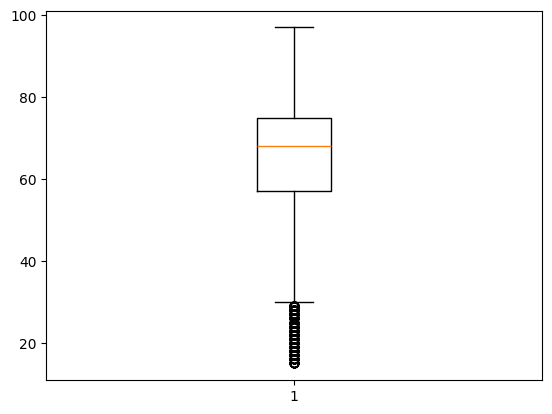

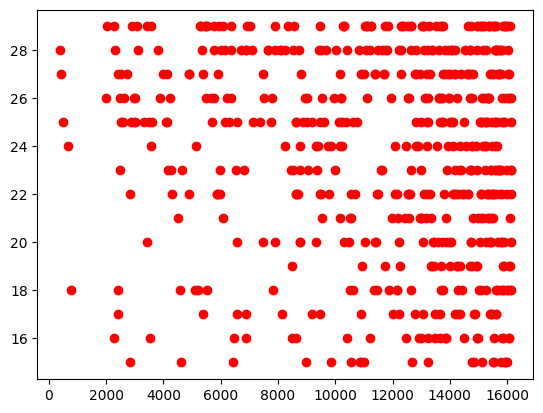

In [11]:
# Check for outliers
# Calculate the IQR for a specific column in the dataset
column_name = "Sprint Speed"
Q1 = male_players[column_name].quantile(0.25)
Q3 = male_players[column_name].quantile(0.75)
IQR = Q3 - Q1

# Identify outliers as values outside the range (Q1 - 1.5 * IQR) to (Q3 + 1.5 * IQR)
outliers = male_players[(male_players[column_name] < (Q1 - 1.5 * IQR)) | (male_players[column_name] > (Q3 + 1.5 * IQR))]
# Plot the data and highlight the outliers
plt.boxplot(male_players[column_name])
plt.show()
plt.scatter(x=outliers.index, y=outliers[column_name], color='red')
plt.show()

In [12]:

# Lists to store different types of columns
cat = []        # Categorical columns
num = []        # Numerical columns
identifier = [] # Columns to exclude from cat/num

# Columns to exclude from categorical or numerical classification
exclude = ['Rank', 'url']

# Loop through each column in the dataset
for column in male_players.columns:
    if column in exclude:
        identifier.append(column)  # Add to identifier list if it's in the exclude list
    elif pd.api.types.is_numeric_dtype(male_players[column]):
        if male_players[column].nunique() > 10:
            num.append(column)  # Add to numerical list if it has more than 10 unique values
        else:
            cat.append(column)  # Otherwise, treat it as categorical
    else:
        cat.append(column)  # Non-numeric columns are treated as categorical

# Print out the categorized lists
print("Categorical columns:", cat)
print("Numerical columns:", num)
print("Identifier columns:", identifier)

Categorical columns: ['Name', 'Positioning', 'Finishing', 'Long Shots', 'Volleys', 'Crossing', 'Free Kick Accuracy', 'Curve', 'Dribbling', 'Interceptions', 'Heading Accuracy', 'Def Awareness', 'Standing Tackle', 'Sliding Tackle', 'Position', 'Weak foot', 'Skill moves', 'Preferred foot', 'Height', 'Weight', 'Nation', 'League', 'Team']
Numerical columns: ['OVR', 'PAC', 'SHO', 'PAS', 'DRI', 'DEF', 'PHY', 'Acceleration', 'Sprint Speed', 'Shot Power', 'Penalties', 'Vision', 'Short Passing', 'Long Passing', 'Agility', 'Balance', 'Reactions', 'Ball Control', 'Composure', 'Jumping', 'Stamina', 'Strength', 'Aggression', 'Age']
Identifier columns: ['Rank', 'url']


In [13]:
print(cat)
print(num)

print(len(cat))
print(len(num))

['Name', 'Positioning', 'Finishing', 'Long Shots', 'Volleys', 'Crossing', 'Free Kick Accuracy', 'Curve', 'Dribbling', 'Interceptions', 'Heading Accuracy', 'Def Awareness', 'Standing Tackle', 'Sliding Tackle', 'Position', 'Weak foot', 'Skill moves', 'Preferred foot', 'Height', 'Weight', 'Nation', 'League', 'Team']
['OVR', 'PAC', 'SHO', 'PAS', 'DRI', 'DEF', 'PHY', 'Acceleration', 'Sprint Speed', 'Shot Power', 'Penalties', 'Vision', 'Short Passing', 'Long Passing', 'Agility', 'Balance', 'Reactions', 'Ball Control', 'Composure', 'Jumping', 'Stamina', 'Strength', 'Aggression', 'Age']
23
24


In [14]:
#reducing the dataset size
df=male_players.head(10)

Text(0.5, 1.0, 'Number of Long Shots')

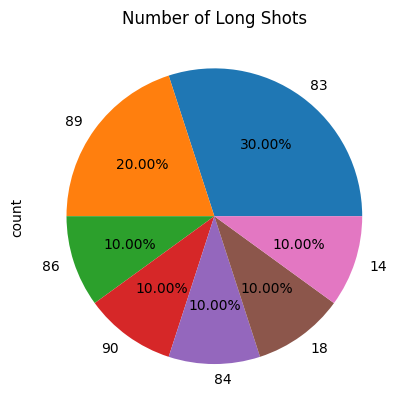

In [15]:
# UNIVARIATE ANALYSIS

# CATEGORICAL

df['Long Shots'].value_counts().plot(kind="pie",autopct="%1.2f%%")
plt.title('Number of Long Shots')


Text(0.5, 1.0, 'Mode of Long Shots')

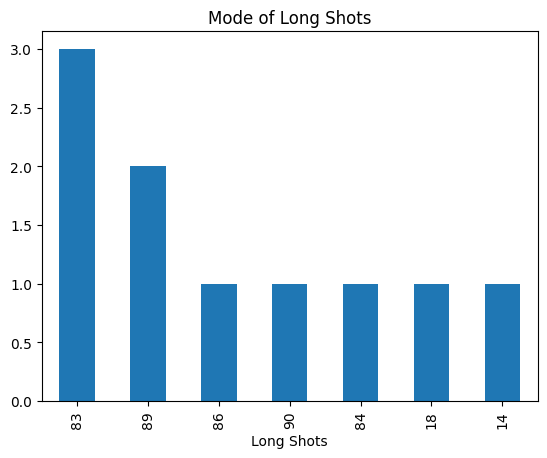

In [16]:
df['Long Shots'].value_counts().plot(kind="bar")
plt.title('Mode of Long Shots')

Text(0.5, 1.0, 'Distribution of DEF')

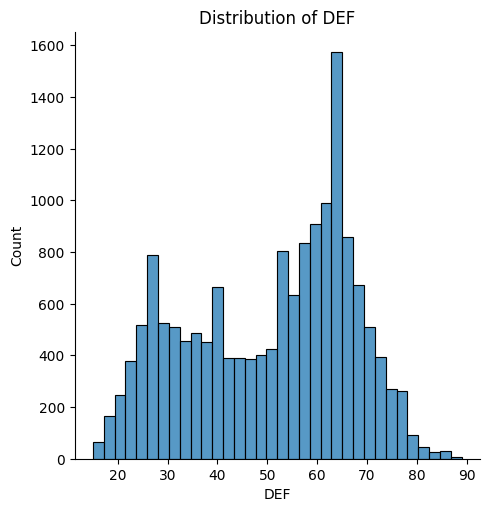

In [17]:
# Numerical

sns.displot(male_players['DEF'])
plt.title('Distribution of DEF')

In [18]:
male_players['DEF'].skew()

np.float64(-0.3029720686230267)

Text(0.5, 1.0, 'Box Plot of DEF')

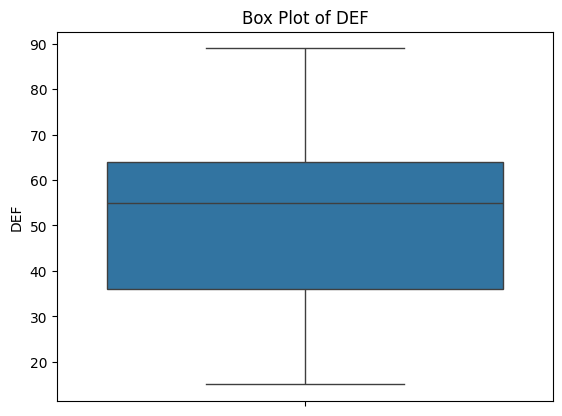

In [19]:
sns.boxplot(male_players['DEF'])
plt.title('Box Plot of DEF')

<Axes: xlabel='DEF', ylabel='PAC'>

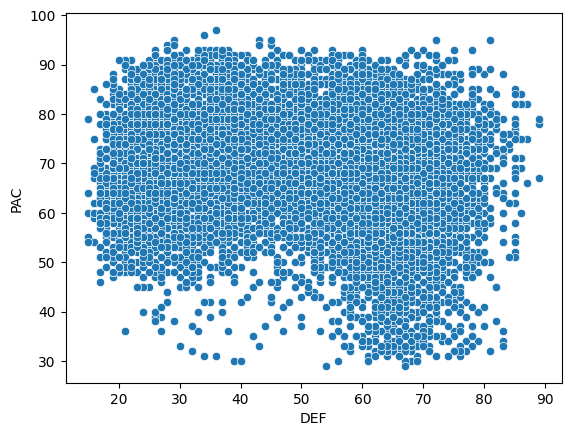

In [20]:
# BIVARIATE ANALYSIS

# numerical numerical

sns.scatterplot(data = male_players,x="DEF",y="PAC")

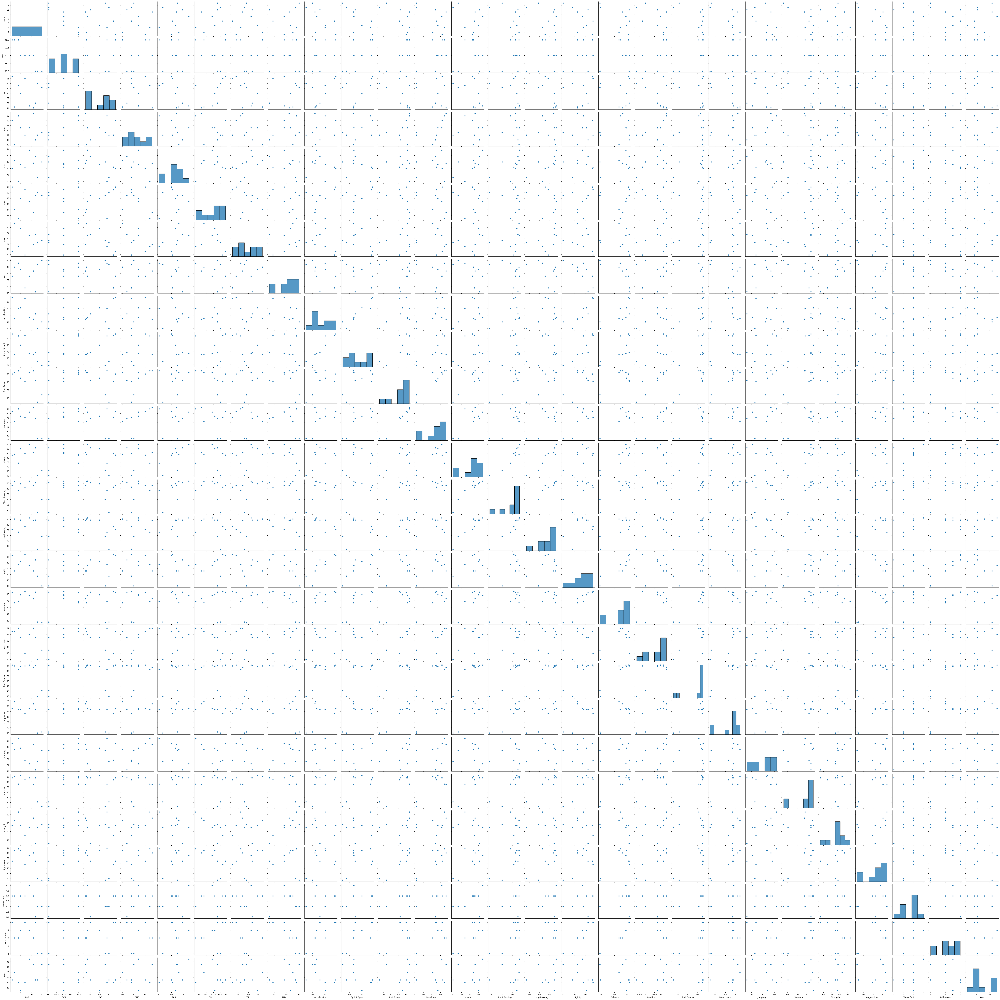

In [21]:
g = sns.pairplot(df)

<Axes: xlabel='Weak foot', ylabel='DEF'>

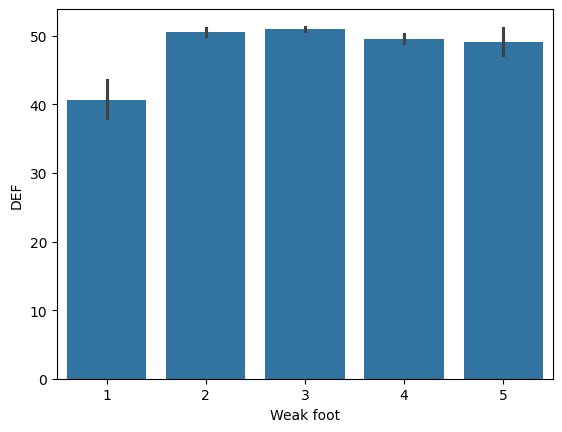

In [23]:
# categorical numerical
sns.barplot(data=male_players,x="Weak foot",y="DEF")

<Axes: xlabel='League', ylabel='Penalties'>

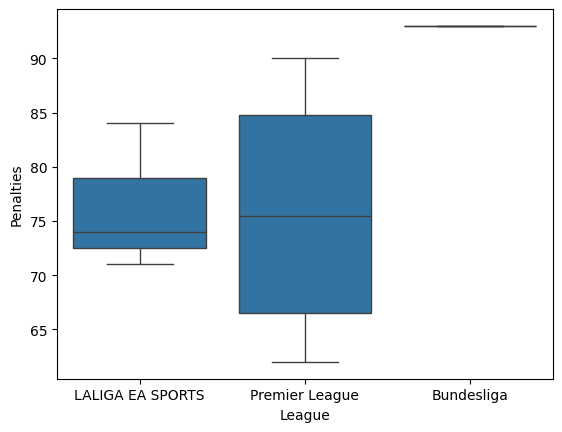

In [24]:
df1=male_players.head(8)
sns.boxplot(data=df1, x="League", y="Penalties")

C:\Users\manda\AppData\Local\Temp\ipykernel_16328\1356473465.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='League',y='Penalties',data=df1 ,palette='rainbow')


<Axes: xlabel='League', ylabel='Penalties'>

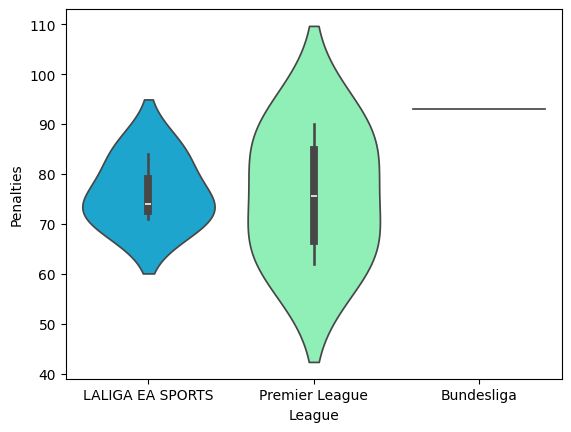

In [25]:
sns.violinplot(x='League',y='Penalties',data=df1 ,palette='rainbow')

In [26]:
# categorical categorical

pd.crosstab(male_players['League'],male_players['Finishing'])

Finishing,10,11,12,13,14,15,16,17,18,19,...,94,95,96,g3,g4,g5,g6,g7,g8,g9
League,,,,,,,,,,,,,,,,,,,,,
1A Pro League,3,6,3,1,1,3,1,3,1,2,...,0,0,0,0,2,3,7,8,6,5
3. Liga,0,0,2,2,0,3,1,2,7,9,...,0,0,0,0,3,7,5,9,13,12
3F Superliga,2,2,6,3,2,4,1,0,0,0,...,0,0,0,0,0,1,1,1,3,4
A-League,1,1,1,1,1,1,1,1,1,2,...,0,0,0,0,0,7,2,3,1,2
Allsvenskan,3,1,7,2,2,4,1,2,2,2,...,0,0,0,0,0,3,2,6,4,3
Bundesliga,3,5,5,5,4,3,2,3,1,1,...,0,1,0,0,2,2,3,6,8,8
Bundesliga 2,3,4,4,0,4,2,0,2,1,4,...,0,0,0,0,0,7,8,7,12,9
CSL,5,2,8,1,5,1,5,5,2,4,...,0,0,0,0,0,2,3,3,4,13
CSSL,3,1,2,4,1,1,2,0,2,1,...,0,0,0,0,1,1,4,5,2,5


<Axes: xlabel='Finishing', ylabel='Preferred foot'>

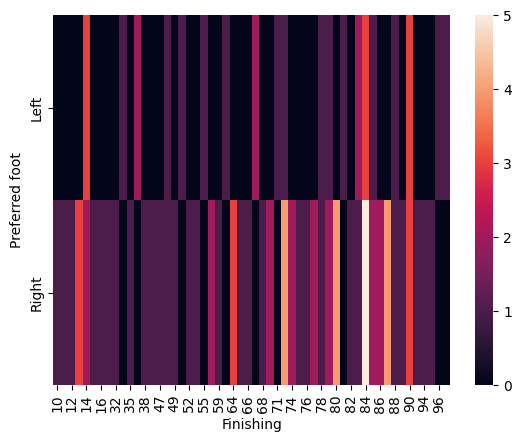

In [27]:
df2=male_players.head(100)
sns.heatmap(pd.crosstab(df2['Preferred foot'],df2['Finishing']))

In [28]:
# Option 1: Z-Score

z = np.abs(scipy.stats.zscore(male_players["DEF"]))
print(z)

#dropping outliers
male_players = male_players[(z < 3)]

0        0.893932
1        2.230422
2        0.342575
3        1.679066
4        1.322765
           ...   
16156    1.016455
16157    0.648884
16158    0.465099
16159    0.587622
16160    0.465099
Name: DEF, Length: 16161, dtype: float64


In [29]:
# chi 2 test caegorical and categorical

contigency= pd.crosstab(male_players['League'], male_players['Finishing']) 
contigency

Finishing,10,11,12,13,14,15,16,17,18,19,...,94,95,96,g3,g4,g5,g6,g7,g8,g9
League,,,,,,,,,,,,,,,,,,,,,
1A Pro League,3,6,3,1,1,3,1,3,1,2,...,0,0,0,0,2,3,7,8,6,5
3. Liga,0,0,2,2,0,3,1,2,7,9,...,0,0,0,0,3,7,5,9,13,12
3F Superliga,2,2,6,3,2,4,1,0,0,0,...,0,0,0,0,0,1,1,1,3,4
A-League,1,1,1,1,1,1,1,1,1,2,...,0,0,0,0,0,7,2,3,1,2
Allsvenskan,3,1,7,2,2,4,1,2,2,2,...,0,0,0,0,0,3,2,6,4,3
Bundesliga,3,5,5,5,4,3,2,3,1,1,...,0,1,0,0,2,2,3,6,8,8
Bundesliga 2,3,4,4,0,4,2,0,2,1,4,...,0,0,0,0,0,7,8,7,12,9
CSL,5,2,8,1,5,1,5,5,2,4,...,0,0,0,0,0,2,3,3,4,13
CSSL,3,1,2,4,1,1,2,0,2,1,...,0,0,0,0,1,1,4,5,2,5


In [30]:
c, p, dof, expected = chi2_contingency(contigency) 
print(p)

2.7369518160542586e-115


In [65]:
# Identify non-numeric values
non_numeric_values = male_players[~male_players['Long Shots'].str.isdigit()]
print(non_numeric_values)

# Convert non-numeric values to NaN
male_players['Long Shots'] = pd.to_numeric(male_players['Long Shots'], errors='coerce')

# Optionally, drop rows with NaN values
male_players = male_players.dropna(subset=['Long Shots'])

male_players['Long Shots'] = male_players['Long Shots'].astype(int)

        Rank                  Name       OVR  PAC       SHO       PAS  DRI  \
77       101  Giorgi Mamardashvili -0.176456  NaN  0.863014  0.681159   85   
117      149           Diogo Costa -0.230524  NaN  0.794521  0.826087   86   
127      149     Guglielmo Vicario -0.212175  NaN  0.821918  0.782609   87   
317      458          Andriy Lunin -0.287682  NaN  0.794521  0.753623   82   
344      458         Álvaro Valles -0.287682  NaN  0.808219  0.782609   83   
...      ...                   ...       ...  ...       ...       ...  ...   
16121  17686        Lee Seung Hwan -1.275069  NaN  0.356164  0.362319   55   
16124  17686            Alex Rando -1.329136  NaN  0.369863  0.376812   46   
16126  17686          Roh Hee Dong -1.275069  NaN  0.410959  0.405797   50   
16132  17686      Alexander Turkin -0.961411  NaN  0.342466  0.405797   49   
16138  17686         Zhou Zhengkai -0.923671  NaN  0.397260  0.347826   46   

       DEF  PHY  Acceleration  ...  Preferred foot         Heig

In [80]:
# t-test - Categorical and Numerical  'Acceleration'
tr=male_players.dropna(axis=0,how='any')
tr.describe()
a = tr[tr['Long Shots'] >80]['Acceleration']
b = tr[tr['Long Shots'] <=80 ]['Acceleration']
t,p =st.ttest_ind(a,b)
print(f't-statistic: {t}, p-value: {p}')

t-statistic: 2.304400656301644, p-value: 0.050125310952819184


In [82]:
# ANOVA - Categorical and Numerical
fvalue, pvalue = st.f_oneway(a,b)
print(fvalue, pvalue)

5.31026238476345 0.05012531095281914


In [83]:
# Linear - Numerical and Numerical
x = tr['DEF'].to_numpy()
y = tr['PAC'].to_numpy()
np.corrcoef(x, y)

array([[ 1.        , -0.05271415],
       [-0.05271415,  1.        ]])

In [84]:
#Z-score normalization
from sklearn.preprocessing import StandardScaler

# Drop missing values for simplicity
male_players.dropna(subset=['PAS'], inplace=True)

# Z-score normalization of the 'PAS' column
scaler = StandardScaler()
male_players['PAS_zscore'] = scaler.fit_transform(male_players[['PAS']])

# Display the first few rows
print(male_players[['PAS', 'PAS_zscore']].head())

        PAS  PAS_zscore
0  0.797101    2.209491
1  0.884058    2.821771
2  0.652174    1.189025
3  0.840580    2.515631
4  0.811594    2.311538


In [85]:
# decimal scaling normalization

# Find the maximum absolute value in the PAS column
max_val = np.max(np.abs(male_players['PAS']))

# Calculate j (the smallest integer such that max(|x'|) < 1)
j = np.ceil(np.log10(max_val))

# Apply decimal scaling normalization
male_players['PAS_scaled'] = male_players['PAS'] / (10**j)

# Display the first few rows
print(male_players[['PAS', 'PAS_scaled']].head())

        PAS  PAS_scaled
0  0.797101    0.797101
1  0.884058    0.884058
2  0.652174    0.652174
3  0.840580    0.840580
4  0.811594    0.811594


In [88]:
# Check for infinite values
print(male_players[['OVR', 'PAC', 'SHO', 'PAS']].isin([np.inf, -np.inf]).sum())

# Check for extremely large values
print(male_players[['OVR', 'PAC', 'SHO', 'PAS']].max())

# Replace infinite values with NaN
male_players[['OVR', 'PAC', 'SHO', 'PAS']] = male_players[['OVR', 'PAC', 'SHO', 'PAS']].replace([np.inf, -np.inf], np.nan)

# Optionally, drop rows with NaN values
male_players.dropna(subset=['OVR', 'PAC', 'SHO', 'PAS'], inplace=True)


OVR    2
PAC    0
SHO    0
PAS    0
dtype: int64
OVR    0.00000
PAC    4.51086
SHO    1.00000
PAS    1.00000
dtype: float64


In [89]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder

# Normalize the variables
scaler = MinMaxScaler()
male_players[['OVR', 'PAC', 'SHO', 'PAS']] = scaler.fit_transform(male_players[['OVR', 'PAC', 'SHO', 'PAS']])

# Check the result
male_players.head()

,Rank,Name,OVR,PAC,SHO,PAS,DRI,DEF,PHY,Acceleration,...,Preferred foot,Height,Weight,Age,Nation,League,Team,url,PAS_zscore,PAS_scaled
0,1,Kylian Mbappé,1.000000,1.000000,0.769231,0.416667,92,36,78,97,...,Right,"182cm / 6'0""",75kg / 165lb,25,France,LALIGA EA SPORTS,Real Madrid,https://www.ea.com/games/ea-sports-fc/ratings/...,2.209491,0.797101
1,2,Rodri,0.043081,1.000000,0.000000,0.666667,84,87,85,65,...,Right,"191cm / 6'3""",82kg / 181lb,28,Spain,Premier League,Manchester City,https://www.ea.com/games/ea-sports-fc/ratings/...,2.821771,0.884058
2,4,Erling Haaland,0.776772,1.000000,0.923077,0.000000,81,45,88,80,...,Left,"195cm / 6'5""",94kg / 207lb,24,Norway,Premier League,Manchester City,https://www.ea.com/games/ea-sports-fc/ratings/...,1.189025,0.652174
3,5,Jude Bellingham,0.547662,0.502778,0.538462,0.541667,88,78,83,81,...,Right,"186cm / 6'1""",75kg / 165lb,21,England,LALIGA EA SPORTS,Real Madrid,https://www.ea.com/games/ea-sports-fc/ratings/...,2.515631,0.840580
4,7,Vini Jr.,0.953061,0.502778,0.307692,0.458333,91,29,69,95,...,Right,"176cm / 5'9""",73kg / 161lb,24,Brazil,LALIGA EA SPORTS,Real Madrid,https://www.ea.com/games/ea-sports-fc/ratings/...,2.311538,0.811594


In [90]:
# Encode the Positioning variable
le = LabelEncoder()
male_players['Positioning'] = le.fit_transform(male_players['Positioning'])

# Check the result
male_players.head()

,Rank,Name,OVR,PAC,SHO,PAS,DRI,DEF,PHY,Acceleration,...,Preferred foot,Height,Weight,Age,Nation,League,Team,url,PAS_zscore,PAS_scaled
0,1,Kylian Mbappé,1.000000,1.000000,0.769231,0.416667,92,36,78,97,...,Right,"182cm / 6'0""",75kg / 165lb,25,France,LALIGA EA SPORTS,Real Madrid,https://www.ea.com/games/ea-sports-fc/ratings/...,2.209491,0.797101
1,2,Rodri,0.043081,1.000000,0.000000,0.666667,84,87,85,65,...,Right,"191cm / 6'3""",82kg / 181lb,28,Spain,Premier League,Manchester City,https://www.ea.com/games/ea-sports-fc/ratings/...,2.821771,0.884058
2,4,Erling Haaland,0.776772,1.000000,0.923077,0.000000,81,45,88,80,...,Left,"195cm / 6'5""",94kg / 207lb,24,Norway,Premier League,Manchester City,https://www.ea.com/games/ea-sports-fc/ratings/...,1.189025,0.652174
3,5,Jude Bellingham,0.547662,0.502778,0.538462,0.541667,88,78,83,81,...,Right,"186cm / 6'1""",75kg / 165lb,21,England,LALIGA EA SPORTS,Real Madrid,https://www.ea.com/games/ea-sports-fc/ratings/...,2.515631,0.840580
4,7,Vini Jr.,0.953061,0.502778,0.307692,0.458333,91,29,69,95,...,Right,"176cm / 5'9""",73kg / 161lb,24,Brazil,LALIGA EA SPORTS,Real Madrid,https://www.ea.com/games/ea-sports-fc/ratings/...,2.311538,0.811594


In [91]:
# Aggregate the data by Positioning and get summary statistics
agg_df = male_players.groupby(['Positioning']).agg({'OVR': 'mean', 
                                      'PAC': 'mean', 
                                      'SHO': 'mean', 
                                      'PAS': 'mean'})

# Check the result
print(agg_df)

                  OVR       PAC       SHO       PAS
Positioning                                        
0            0.722548  0.000000  0.384615  0.625000
1            0.829189  0.000000  0.307692  0.125000
2            0.043081  1.000000  0.000000  0.666667
3            0.204490  0.000000  0.153846  0.791667
4            0.953061  0.502778  0.307692  0.458333
5            0.085013  0.502778  0.538462  1.000000
6            0.547662  0.502778  0.538462  0.541667
7            1.000000  1.000000  0.769231  0.416667
8            0.000000  0.502778  1.000000  0.583333
9            0.776772  1.000000  0.923077  0.000000


In [92]:
# Log-transform the OVR and PAC
male_players['OVR'] = np.log(male_players['PAC'])
male_players['PAC'] = np.log(df['OVR'])

# Check the result
print(male_players.head(20))

   Rank                  Name       OVR       PAC       SHO       PAS  DRI  \
0     1         Kylian Mbappé  0.000000  0.255413  0.769231  0.416667   92   
1     2                 Rodri  0.000000  0.255413  0.000000  0.666667   84   
2     4        Erling Haaland  0.000000  0.255413  0.923077  0.000000   81   
3     5       Jude Bellingham -0.687607      -inf  0.538462  0.541667   88   
4     7              Vini Jr. -0.687607      -inf  0.307692  0.458333   91   
5     9       Kevin De Bruyne -0.687607      -inf  0.538462  1.000000   87   
6    11            Harry Kane -0.687607      -inf  1.000000  0.583333   83   
7    12       Martin Ødegaard      -inf       NaN  0.153846  0.791667   89   
8    13  Gianluigi Donnarumma      -inf       NaN  0.307692  0.125000   90   
9    15               Alisson      -inf       NaN  0.384615  0.625000   89   

   DEF  PHY  Acceleration  ...  Preferred foot         Height        Weight  \
0   36   78            97  ...           Right   182cm / 6'0" 

In [93]:
# Scale the variables
scaler = StandardScaler()
df[['OVR', 'PAC', 'SHO', 'PAS']] = scaler.fit_transform(df[['OVR', 'PAC', 'SHO', 'PAS']])

# Check the result
print(df.head())

   Rank             Name           OVR       PAC       SHO       PAS  DRI  \
0     1    Kylian Mbappé  1.290994e+00  1.401755  0.893325 -0.372471   92   
1     2            Rodri  1.290994e+00 -1.215980 -1.588133  0.521460   84   
2     4   Erling Haaland  1.290994e+00  0.641767  1.389617 -1.862356   81   
3     5  Jude Bellingham -4.440892e-17 -0.033777  0.148888  0.074494   88   
4     7         Vini Jr. -4.440892e-17  1.232869 -0.595550 -0.223483   91   

   DEF  PHY  Acceleration  ...  Weak foot Skill moves Preferred foot  \
0   36   78            97  ...          4           5          Right   
1   87   85            65  ...          4           3          Right   
2   45   88            80  ...          3           3           Left   
3   78   83            81  ...          4           4          Right   
4   29   69            95  ...          4           5          Right   

         Height        Weight Age   Nation            League             Team  \
0  182cm / 6'0"  75kg /

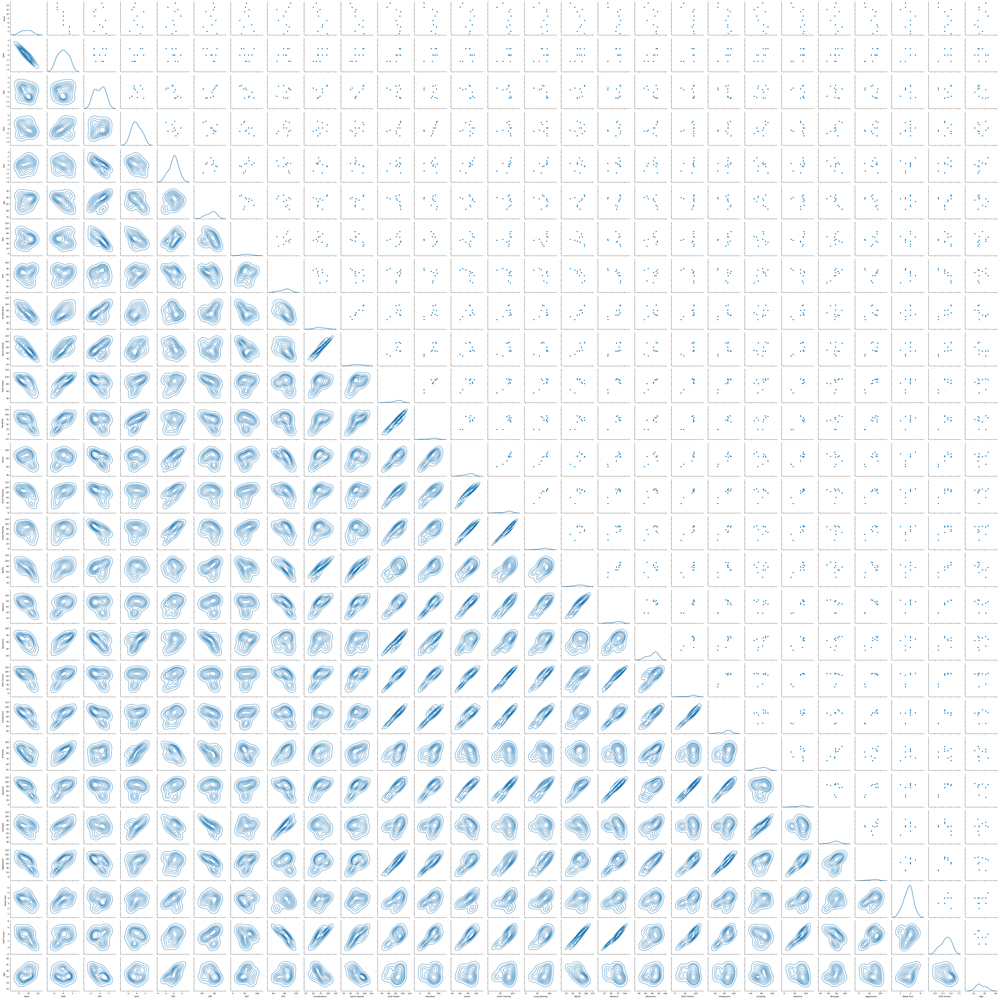

In [94]:
g = sns.PairGrid(df)
g = g.map_upper(sns.scatterplot)
g = g.map_lower(sns.kdeplot, colors="C0")
g = g.map_diag(sns.kdeplot, lw=2)